In this notebook we will use SpatialDE2 to do some spatial analysis: Get spatially variable genes, do spatial clustering, etc.

In [1]:
import os
import pickle

import numpy as np
import pandas as pd

import matplotlib as mpl
import matplotlib.pyplot as plt

%matplotlib inline

import plotnine
from plotnine import *

import anndata as ad
import scanpy as sc

import sys

sys.path.append("/home/kats/SpatialDE")
import SpatialDE

import sys
sys.path.insert(0, "..")
from plot_settings import *

2024-03-11 15:14:55.748052: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudnn.so.8'; dlerror: libcudnn.so.8: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /software/python/3.10.1/lib:/software/python/3.10.1/lib64
2024-03-11 15:14:55.748082: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1850] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


We read in the AnnData files created in the first notebook.

In [2]:
adatas = {}
for f in os.scandir("adatas/human/"):
    adatas[os.path.splitext(f.name)[0]] = ad.read_h5ad(f.path)

We use SpatialDE2 to test for spatially variable genes, i.e. genes that have structured spatial variability as opposed to random noise.

In [6]:
vargenes = {}
for sample, adata in adatas.items():
    vargenes[sample], _ = SpatialDE.test(adata, layer="counts", omnibus=True)

2022-06-08 10:38:26.692753: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10
2022-06-08 10:38:27.592417: I tensorflow/compiler/jit/xla_compilation_cache.cc:314] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


  0%|          | 0/11648 [00:00<?, ?it/s]

  0%|          | 0/15268 [00:00<?, ?it/s]

  0%|          | 0/10297 [00:00<?, ?it/s]

  0%|          | 0/14055 [00:00<?, ?it/s]

  0%|          | 0/15580 [00:00<?, ?it/s]

  0%|          | 0/13805 [00:00<?, ?it/s]

  0%|          | 0/14002 [00:00<?, ?it/s]

  0%|          | 0/15813 [00:00<?, ?it/s]

  0%|          | 0/5951 [00:00<?, ?it/s]

  0%|          | 0/15694 [00:00<?, ?it/s]

  0%|          | 0/16721 [00:00<?, ?it/s]

  0%|          | 0/15993 [00:00<?, ?it/s]

In [9]:
pickle.dump(vargenes, open("vargenes.pkl", "wb"))

In [3]:
vargenes = pickle.load(open("vargenes.pkl", "rb"))

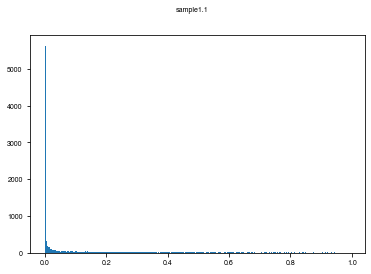

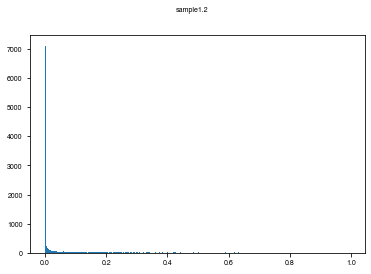

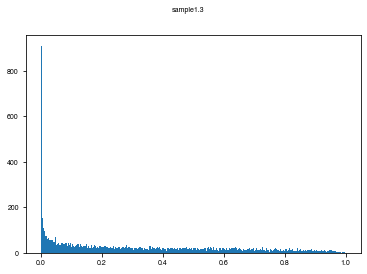

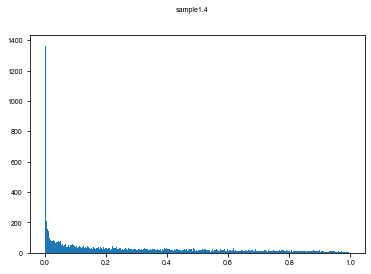

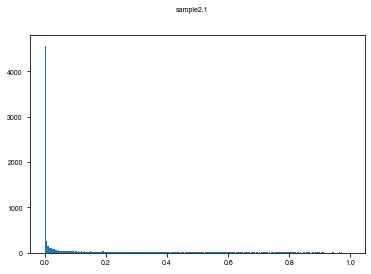

...

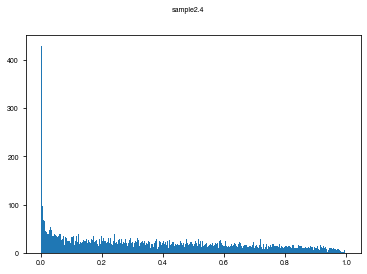

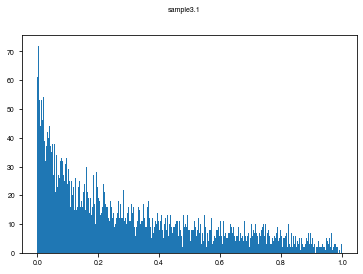

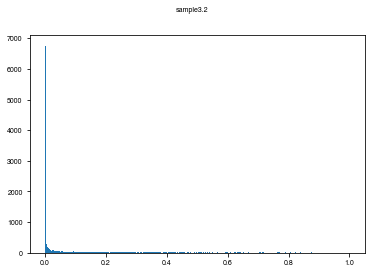

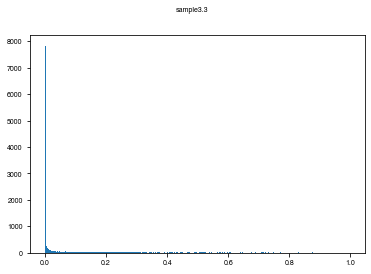

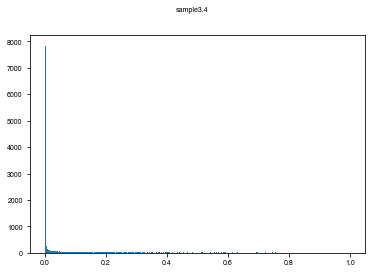

In [4]:
for sample in sorted(vargenes.keys()):
    plt.hist(vargenes[sample].pval, bins=500)
    plt.suptitle(sample)
    plt.show()

We now use the 2000 most highly expressed variable genes to define transcriptionally similar regions in space. We use SpatialDE2's spatial clustering algorithm that incorporates a spatial smoothness assumption: neighboring spots are more likely to belong to the same region.

In [5]:
segmentations = {}
for sample, adata in adatas.items():
    genes = (
        vargenes[sample]
        .query("padj < 0.001 and not gene.str.startswith('MT-').values")
        .set_index("gene")
        .assign(totalcounts=adata.var.total_counts)
        .sort_values("totalcounts", ascending=False)
        .iloc[
            :2000,
        ]
        .index.values
    )
    segmentations[sample] = SpatialDE.tissue_segmentation(
        adata, layer="counts", genes=genes, rng=np.random.default_rng(42)
    )

The spatial clustering results are plotted.

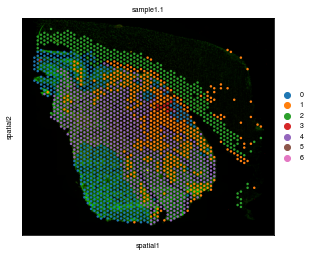

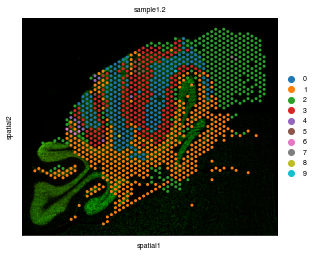

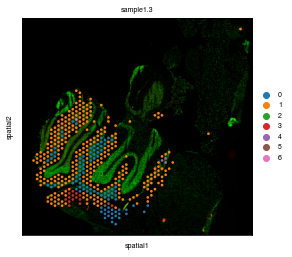

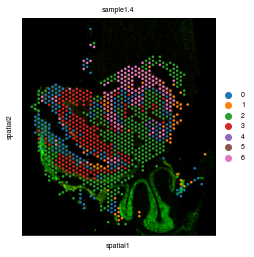

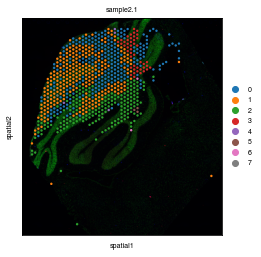

...

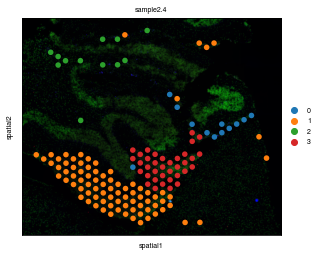

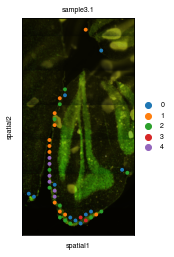

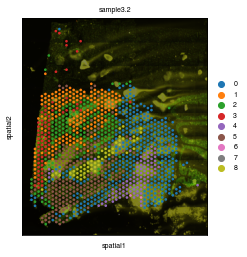

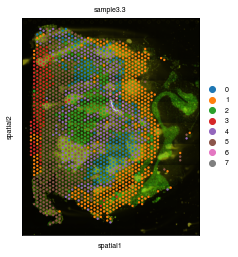

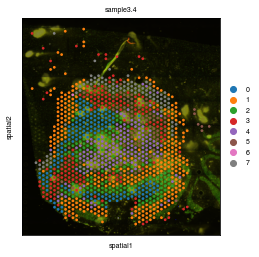

In [6]:
for sample in sorted(adatas.keys()):
    sc.pl.spatial(adatas[sample], color="segmentation_labels", title=sample)

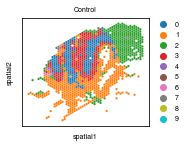

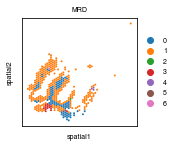

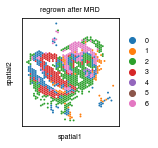

In [7]:
with mpl.rc_context({"figure.figsize": (3, 2)}):
    sc.pl.spatial(
        adatas["sample1.2"],
        color="segmentation_labels",
        title="Control",
        size=1.5,
        img_key=None,
        show=False,
    )
    plt.savefig("figures/S21_control.svgz")
    plt.show()
    sc.pl.spatial(
        adatas["sample1.3"],
        color="segmentation_labels",
        title="MRD",
        size=1.5,
        img_key=None,
        show=False,
    )
    plt.savefig("figures/S21_mrd.svgz")
    plt.show()
    sc.pl.spatial(
        adatas["sample1.4"],
        color="segmentation_labels",
        title="regrown after MRD",
        size=1.5,
        img_key=None,
        show=False,
    )
    plt.savefig("figures/S21_regrown.svgz")
    plt.show()

We write the AnnData objects with the clustering results to disk.

In [13]:
for sample, adata in adatas.items():
    adata.write_h5ad(
        f"adatas/human/{sample}.h5ad", compression="gzip", compression_opts=9
    )

In [8]:
df = []
for sample, adata in adatas.items():
    regions, counts = np.unique(adata.obs.segmentation_labels, return_counts=True)
    df.append(
        pd.DataFrame(
            {
                "sample": sample,
                "region": regions,
                "n_spots": counts,
                "fraction_spots": counts / adata.shape[0],
            }
        )
    )
df = pd.concat(df).reset_index(drop=True).sort_values(["sample", "region"])

In [9]:
with pd.option_context("display.max_rows", 100):
    display(df)

,sample,region,n_spots,fraction_spots
28,sample1.1,0,498,0.254992
29,sample1.1,1,428,0.219150
30,sample1.1,2,283,0.144905
31,sample1.1,3,9,0.004608
32,sample1.1,4,732,0.374808
33,sample1.1,5,2,0.001024
34,sample1.1,6,1,0.000512
42,sample1.2,0,211,0.180961
43,sample1.2,1,443,0.379931
44,sample1.2,2,281,0.240995


We now use SpatialDE2 to detect spatially variable genes separately for each tissue region.

In [ ]:
region_vargenes = {}
for sample, adata in adatas.items():
    cvargenes = {}
    for region in adata.obs.segmentation_labels.cat.categories:
        cadata = adata[adata.obs.segmentation_labels == region, :]
        if cadata.n_obs > 10:
            cvargenes[region] = SpatialDE.test(cadata, layer="counts", omnibus=True)[0]
    region_vargenes[sample] = cvargenes

  0%|          | 0/11648 [00:00<?, ?it/s]

  0%|          | 0/11648 [00:00<?, ?it/s]

  0%|          | 0/11648 [00:00<?, ?it/s]

  0%|          | 0/15268 [00:00<?, ?it/s]

  0%|          | 0/15268 [00:00<?, ?it/s]

  0%|          | 0/15268 [00:00<?, ?it/s]

  0%|          | 0/15268 [00:00<?, ?it/s]

  0%|          | 0/15268 [00:00<?, ?it/s]

  0%|          | 0/15268 [00:00<?, ?it/s]

  0%|          | 0/15268 [00:00<?, ?it/s]

  0%|          | 0/10297 [00:00<?, ?it/s]

  0%|          | 0/10297 [00:00<?, ?it/s]

  0%|          | 0/10297 [00:00<?, ?it/s]

  0%|          | 0/10297 [00:00<?, ?it/s]

  0%|          | 0/14055 [00:00<?, ?it/s]

  0%|          | 0/14055 [00:00<?, ?it/s]

  0%|          | 0/14055 [00:00<?, ?it/s]

  0%|          | 0/14055 [00:00<?, ?it/s]

  0%|          | 0/15580 [00:00<?, ?it/s]

  0%|          | 0/15580 [00:00<?, ?it/s]

  0%|          | 0/15580 [00:00<?, ?it/s]

  0%|          | 0/15580 [00:00<?, ?it/s]

  0%|          | 0/13805 [00:00<?, ?it/s]

  0%|          | 0/13805 [00:00<?, ?it/s]

  0%|          | 0/13805 [00:00<?, ?it/s]

  0%|          | 0/13805 [00:00<?, ?it/s]

  0%|          | 0/13805 [00:00<?, ?it/s]

  0%|          | 0/14002 [00:00<?, ?it/s]

  0%|          | 0/14002 [00:00<?, ?it/s]

  0%|          | 0/14002 [00:00<?, ?it/s]

  0%|          | 0/14002 [00:00<?, ?it/s]

  0%|          | 0/15813 [00:00<?, ?it/s]

  0%|          | 0/15813 [00:00<?, ?it/s]

  0%|          | 0/15813 [00:00<?, ?it/s]

  0%|          | 0/15813 [00:00<?, ?it/s]

  0%|          | 0/15813 [00:00<?, ?it/s]

  0%|          | 0/15813 [00:00<?, ?it/s]

  0%|          | 0/15813 [00:00<?, ?it/s]

  0%|          | 0/5951 [00:00<?, ?it/s]

  0%|          | 0/5951 [00:00<?, ?it/s]

  0%|          | 0/5951 [00:00<?, ?it/s]

  0%|          | 0/15694 [00:00<?, ?it/s]

  0%|          | 0/15694 [00:00<?, ?it/s]

  0%|          | 0/15694 [00:00<?, ?it/s]

  0%|          | 0/15694 [00:00<?, ?it/s]

  0%|          | 0/15694 [00:00<?, ?it/s]

  0%|          | 0/15694 [00:00<?, ?it/s]

  0%|          | 0/15694 [00:00<?, ?it/s]

  0%|          | 0/16721 [00:00<?, ?it/s]

  0%|          | 0/16721 [00:00<?, ?it/s]

  0%|          | 0/16721 [00:00<?, ?it/s]

  0%|          | 0/16721 [00:00<?, ?it/s]

In [55]:
pickle.dump(region_vargenes, open("region_vargenes_human.pkl", "wb"))

In [74]:
os.makedirs("region_vargenes_human", exist_ok=True)
for sample, regions in region_vargenes.items():
    for region, df in regions.items():
        df[df.padj < 0.01].to_csv(
            f"region_vargenes_human/{sample}_region{region}.csv", index=False
        )

We want to perform differential gene expression analysis between control (untreated), resistant (MRD), and regrown tumor cells. We will use region 3 of sample 1.2 as control, region 0 of sample 1.3 as resistant, and region 0 of sample 1.4 as regrown. We will use DESeq2 through the rpy2 interface.

In [9]:
import rpy2.robjects as robjects
from rpy2.robjects.packages import importr
from rpy2.robjects import numpy2ri
from rpy2.robjects import pandas2ri
from scipy.sparse import issparse, isspmatrix_csc, isspmatrix_csr

numpy2ri.activate()
pandas2ri.activate()
%load_ext rpy2.ipython

As DESeq2 requires a single cell x gene matrix, we first determine the set of genes detected in all samples. We then subset the data and copy it over to R.

In [10]:
intersect = (
    adatas["sample1.2"]
    .var_names.intersection(adatas["sample1.3"].var_names)
    .intersection(adatas["sample1.4"].var_names)
)
sample1_2 = adatas["sample1.2"][
    adatas["sample1.2"].obs.segmentation_labels == 3, intersect
]
sample1_3 = adatas["sample1.3"][
    adatas["sample1.3"].obs.segmentation_labels == 0, intersect
]
sample1_4 = adatas["sample1.4"][
    adatas["sample1.4"].obs.segmentation_labels == 0, intersect
]

robjects.r.assign("indices1_2", sample1_2.layers["counts"].indices)
robjects.r.assign("indptr1_2", sample1_2.layers["counts"].indptr)
robjects.r.assign("data1_2", sample1_2.layers["counts"].data)
robjects.r.assign("cells1_2", sample1_2.obs_names.to_numpy())

robjects.r.assign("indices1_3", sample1_3.layers["counts"].indices)
robjects.r.assign("indptr1_3", sample1_3.layers["counts"].indptr)
robjects.r.assign("data1_3", sample1_3.layers["counts"].data)
robjects.r.assign("cells1_3", sample1_3.obs_names.to_numpy())

robjects.r.assign("indices1_4", sample1_4.layers["counts"].indices)
robjects.r.assign("indptr1_4", sample1_4.layers["counts"].indptr)
robjects.r.assign("data1_4", sample1_4.layers["counts"].data)
robjects.r.assign("cells1_4", sample1_4.obs_names.to_numpy())

robjects.r.assign("genes", sample1_2.var_names.to_numpy())

'LINC01409','LINC01128','NOC2L',...,'AC240274...,'AC004556...,'AC007325...


We prepare the R data matrix.

In [11]:
%%R
library(Matrix)
mat1_2 <- sparseMatrix(i=as.vector(indices1_2), p=as.vector(indptr1_2), x=as.vector(data1_2), repr='C', index1=FALSE)
colnames(mat1_2) <- paste0("1.2_", cells1_2)
rownames(mat1_2) <- genes

mat1_3 <- sparseMatrix(i=as.vector(indices1_3), p=as.vector(indptr1_3), x=as.vector(data1_3), repr='C', index1=FALSE)
colnames(mat1_3) <- paste0("1.3_", cells1_3)
rownames(mat1_3) <- genes

mat1_4 <- sparseMatrix(i=as.vector(indices1_4), p=as.vector(indptr1_4), x=as.vector(data1_4), repr='C', index1=FALSE)
colnames(mat1_4) <- paste0("1.4_", cells1_4)
rownames(mat1_4) <- genes

mat <- cbind(mat1_2, mat1_3, mat1_4)

We prepare the metadata for DESeq2 and create a DESeq2 object.

In [12]:
%%R
colData <- data.frame(type=factor(c(rep("normal_tumor", ncol(mat1_2)), rep("resistant", ncol(mat1_3)), rep("regrown", ncol(mat1_4)))), row.names=colnames(mat))

library(DESeq2)
dds <- DESeqDataSetFromMatrix(countData=mat, colData=colData, design=~type)

R[write to console]: Loading required package: S4Vectors

R[write to console]: Loading required package: stats4

R[write to console]: Loading required package: BiocGenerics

R[write to console]: 
Attaching package: ‘BiocGenerics’


R[write to console]: The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


R[write to console]: The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, Map, mapply, match, mget,
    order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rbind, Reduce, rownames, sapply, setdiff, sort, table, tapply,
    union, unique, unsplit, which.max, which.min


R[write to console]: 
Attaching package: ‘S4Vectors’


R[write to console]: The following objects are masked from ‘package:Matrix’:

    expand, unname


R[write to console]: The following o

We run the analysis and get the results.

In [13]:
%%R
dds <- DESeq(dds)
res1 <- results(dds, contrast=c("type", "resistant", "normal_tumor"))
res1$comparison <- "resistant/normal"
res2 <- results(dds, contrast=c("type", "regrown", "normal_tumor"))
res2$comparison <- "regrown/normal"
res3 <- results(dds, contrast=c("type", "regrown", "resistant"))
res3$comparison <- "regrown/resistant"

res <- rbind(res1, res2, res3)
res$padj <- p.adjust(res$pvalue, method="BH")
res$gene <- rownames(res)
rownames(res) <- NULL
res <- res[c("gene", "comparison", colnames(res)[1:(ncol(res)-2)])]

R[write to console]: estimating size factors

R[write to console]: estimating dispersions

R[write to console]: gene-wise dispersion estimates

R[write to console]: mean-dispersion relationship

R[write to console]: -- note: fitType='parametric', but the dispersion trend was not well captured by the
   function: y = a/x + b, and a local regression fit was automatically substituted.
   specify fitType='local' or 'mean' to avoid this message next time.

R[write to console]: final dispersion estimates

R[write to console]: fitting model and testing



We get the results from R into our Python session and plot the p-value histogram.

(array([4308.,  784.,  621.,  483.,  448.,  407.,  346.,  356.,  340.,
         322.,  309.,  315.,  285.,  263.,  266.,  277.,  278.,  250.,
         258.,  270.,  267.,  240.,  220.,  242.,  251.,  262.,  242.,
         227.,  243.,  261.,  252.,  203.,  229.,  251.,  215.,  251.,
         242.,  233.,  260.,  248.,  244.,  250.,  231.,  252.,  230.,
         273.,  258.,  219.,  263.,  273.,  255.,  278.,  261.,  269.,
         289.,  253.,  310.,  299.,  262.,  270.,  292.,  297.,  303.,
         322.,  323.,  300.,  328.,  300.,  312.,  334.,  323.,  313.,
         352.,  335.,  343.,  350.,  329.,  365.,  358.,  351.,  372.,
         378.,  376.,  451.,  405.,  416.,  392.,  419.,  433.,  379.,
         388.,  357.,  337.,  357.,  318.,  284.,  283.,  248.,  220.,
         232.]),
 array([1.23292262e-193, 9.99990447e-003, 1.99998089e-002, 2.99997134e-002,
        3.99996179e-002, 4.99995223e-002, 5.99994268e-002, 6.99993313e-002,
        7.99992357e-002, 8.99991402e-002, 9.999904

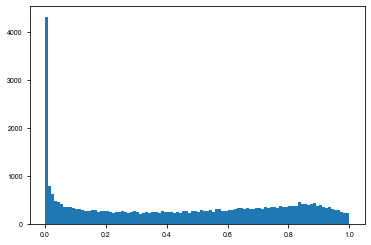

In [14]:
de = robjects.r("as.data.frame(res)").reset_index(drop=True)
de.comparison = pd.Categorical(de.comparison)
plt.hist(de.pvalue, bins=100)

In [15]:
from IPython.display import display

with pd.option_context("display.max_rows", 4000):
    for _, comp in de.groupby("comparison"):
        display(
            comp[(comp.padj < 0.01) & (comp.log2FoldChange.abs() >= 1)].sort_values(
                "log2FoldChange", ascending=False
            )
        )

,gene,comparison,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
11719,PDPN,regrown/normal,0.847747,2.728995,0.178954,15.249730,1.653151e-52,2.303765e-49
15684,FABP7,regrown/normal,0.831191,2.065238,0.188995,10.927500,8.516237e-28,3.371559e-25
18585,DTX3,regrown/normal,0.559394,1.920471,0.193569,9.921381,3.360742e-23,9.147256e-21
18591,CDK4,regrown/normal,2.261595,1.901143,0.102258,18.591588,3.758820e-77,8.730236e-74
18566,ATP5F1B,regrown/normal,5.479116,1.788346,0.071936,24.860122,2.009879e-136,3.501109e-132
18565,BAZ2A,regrown/normal,0.472656,1.714975,0.201378,8.516178,1.649048e-17,2.576286e-15
18592,MARCH9,regrown/normal,0.359918,1.685739,0.231116,7.293922,3.010603e-13,2.789532e-11
18583,KIF5A,regrown/normal,0.605863,1.674113,0.184374,9.079990,1.085852e-19,2.161715e-17
18595,TSFM,regrown/normal,0.460935,1.663450,0.191824,8.671764,4.254785e-18,7.302091e-16
18582,DCTN2,regrown/normal,1.874557,1.663444,0.105549,15.759972,5.865875e-56,8.885271e-53


,gene,comparison,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
25496,GAP43,regrown/resistant,8.343783,3.079510,0.148325,20.761865,9.577643e-96,3.707505e-92
33737,CHGB,regrown/resistant,1.059652,2.402401,0.254697,9.432402,4.008026e-21,9.126511e-19
30179,ATP5F1B,regrown/resistant,5.479116,2.335944,0.114191,20.456429,5.265644e-93,1.834498e-89
30195,DCTN2,regrown/resistant,1.874557,2.303064,0.172225,13.372405,8.765975e-41,7.271376e-38
33777,RALGAPA2,regrown/resistant,1.859134,2.168430,0.209976,10.327026,5.318420e-25,1.654361e-22
33746,SNAP25,regrown/resistant,1.133193,2.167420,0.237832,9.113235,7.996120e-20,1.610271e-17
23956,S100A6,regrown/resistant,2.964644,2.157735,0.185128,11.655360,2.154674e-31,1.103922e-28
30196,KIF5A,regrown/resistant,0.605863,2.153993,0.249237,8.642341,5.507300e-18,9.269025e-16
27297,FABP7,regrown/resistant,0.831191,2.151283,0.252848,8.508211,1.766378e-17,2.747269e-15
34262,SELENOM,regrown/resistant,0.869034,2.068895,0.256951,8.051700,8.165178e-16,1.069424e-13


,gene,comparison,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
4955,HEY1,resistant/normal,0.429347,1.796357,0.247035,7.271657,3.551049e-13,3.247113e-11
9365,SPHK1,resistant/normal,0.808394,1.724909,0.186090,9.269213,1.875236e-20,3.983618e-18
6703,NRIP2,resistant/normal,0.330478,1.592907,0.270987,5.878173,4.148186e-09,2.097513e-07
9955,CRLF1,resistant/normal,0.569896,1.524428,0.214353,7.111760,1.145724e-12,9.831493e-11
8841,SPNS2,resistant/normal,0.522880,1.514130,0.222382,6.808681,9.849776e-12,7.411584e-10
6545,YAP1,resistant/normal,0.221332,1.475498,0.373842,3.946848,7.918679e-05,1.527568e-03
1902,HES6,resistant/normal,3.333385,1.435798,0.096879,14.820570,1.078646e-49,1.342106e-46
106,PDPN,resistant/normal,0.847747,1.418201,0.234274,6.053608,1.416371e-09,7.746459e-08
2431,PLCH1,resistant/normal,0.352568,1.399599,0.266106,5.259551,1.444078e-07,5.433070e-06
4363,GCK,resistant/normal,0.822130,1.397872,0.192819,7.249661,4.178151e-13,3.790693e-11


In [16]:
de.to_feather("regions_deseq.feather")

Volcano plots.

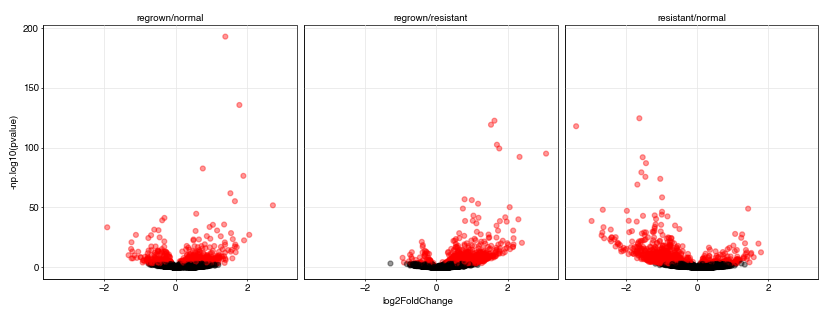

<ggplot: (8734445316748)>

In [17]:
(
    ggplot(de, aes("log2FoldChange", "-np.log10(pvalue)", color="padj < 0.01"))
    + geom_point(alpha=0.4)
    + facet_wrap("comparison", nrow=1)
    + scale_color_manual(values=["black", "red"], breaks=[False, True])
    + guides(color=None)
    + theme(figure_size=(10, 3))
)

/home/kats/.local/lib/python3.10/site-packages/plotnine/ggplot.py:718: PlotnineWarning: Saving 1.95 x 1.95 in image.
/home/kats/.local/lib/python3.10/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Filename: figures/8B_resistantnormal.svgz


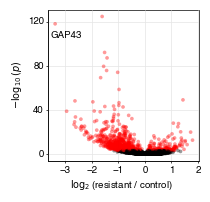

<ggplot: (8734374029337)>

In [18]:
p = (
    ggplot(
        de[de.comparison == "resistant/normal"],
        aes("log2FoldChange", "-np.log10(pvalue)", color="padj < 0.01"),
    )
    + geom_point(alpha=0.4, stroke=0)
    + geom_text(
        aes(label="gene"),
        color="black",
        size=7,
        data=de[(de.comparison == "resistant/normal") & (de.gene == "GAP43")],
        nudge_x=0.4,
        nudge_y=-10,
    )
    + scale_color_manual(values=["black", "red"], breaks=[False, True])
    + labs(x="$\\log_2$(resistant / control)", y="$-\\log_{10}(p)$")
    + guides(color=None)
    + theme(figure_size=(1.95, 1.95))
)
p.save("figures/8B_resistantnormal.svgz")
p

/home/kats/.local/lib/python3.10/site-packages/plotnine/ggplot.py:718: PlotnineWarning: Saving 1.95 x 1.95 in image.
/home/kats/.local/lib/python3.10/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Filename: figures/8B_regrownresistant.svgz


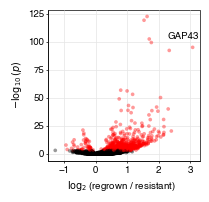

<ggplot: (8734366659575)>

In [19]:
p = (
    ggplot(
        de[de.comparison == "regrown/resistant"],
        aes("log2FoldChange", "-np.log10(pvalue)", color="padj < 0.01"),
    )
    + geom_point(alpha=0.4, stroke=0)
    + geom_text(
        aes(label="gene"),
        color="black",
        size=7,
        data=de[(de.comparison == "regrown/resistant") & (de.gene == "GAP43")],
        nudge_x=-0.3,
        nudge_y=10,
    )
    + scale_color_manual(values=["black", "red"], breaks=[False, True])
    + labs(x="$\\log_2$(regrown / resistant)", y="$-\\log_{10}(p)$")
    + guides(color=None)
    + theme(figure_size=(1.95, 1.95))
)
p.save("figures/8B_regrownresistant.svgz")
p

We now use the hypergeometric test to test for enrichment of genes associated with tumor microtubes in the set of differentially expressed genes.

In [20]:
tm_high = [
    "AGT",
    "ANXA2",
    "APOE",
    "ATF3",
    "ATP1B2",
    "B2M",
    "C1orf61",
    "CALM1",
    "CD63",
    "TIMP1",
    "CEBPD",
    "CHI3L1",
    "CITED1",
    "CLU",
    "CNN3",
    "CRYAB",
    "CST3",
    "CYR61",
    "DNAJB1",
    "FABP7",
    "FEZ1",
    "GADD45B",
    "GAP43",
    "GAPDH",
    "GFAP",
    "HOPX",
    "ID3",
    "MT2A",
    "NDUFB2",
    "NEK6",
    "NMB",
    "PTN",
    "S100A16",
    "SOCS3",
    "SPARC",
    "SPARCL1",
    "TAGLN2",
    "TMSB10",
    "TNFRSF12A",
    "TUBB2A",
]
tm_low = [
    "HNRNPH1",
    "HNRNPA2",
    "EEF2",
    "MT-ND3",
    "GLTSCR2",
    "NOVA1",
    "MARCKSL1",
    "PABPC1",
    "BTG2",
    "TCF12",
    "MTRNR2L8",
    "RPL36A",
    "SOX4",
    "ZBTB20",
    "BTG1",
    "RPSAP58",
    "PTPRS",
    "EGFR",
    "KCNQ1OT1",
    "OLIG1",
    "DSEL",
    "OLIG2",
    "HES6",
    "CHD7",
    "MEST",
    "ACAP3",
    "TNK2",
    "DLL3",
    "SHD",
    "DLL1",
    "SMOC1",
]

In [21]:
from scipy.stats import hypergeom

resnormde = de[(de.padj < 0.01) & (de.comparison == "resistant/normal")]
M = de[de.comparison == "resistant/normal"].shape[0]
N = resnormde.shape[0]

print(
    f"tm_high enrichment pval: {hypergeom.sf(resnormde.gene.isin(tm_high).sum() - 1, M, len(tm_high), N)}"
)
print(
    f"tm_low enrichment pval: {hypergeom.sf(resnormde.gene.isin(tm_low).sum() - 1, M, len(tm_low), N)}"
)

tm_high enrichment pval: 1.803229682246471e-07
tm_low enrichment pval: 0.09632232366781752


In [22]:
resnormde = de[
    (de.padj < 0.01) & (de.comparison == "resistant/normal") & (de.log2FoldChange < 0)
]
N = resnormde.shape[0]

print(
    f"tm_high enrichment pval: {hypergeom.sf(resnormde.gene.isin(tm_high).sum() - 1, M, len(tm_high), N)}"
)

tm_high enrichment pval: 1.6319496552009083e-08


In [23]:
resnormde = de[
    (de.padj < 0.01) & (de.comparison == "resistant/normal") & (de.log2FoldChange > 0)
]
N = resnormde.shape[0]

print(
    f"tm_low enrichment pval: {hypergeom.sf(resnormde.gene.isin(tm_low).sum() - 1, M, len(tm_low), N)}"
)

tm_low enrichment pval: 0.007692620247209299


We will now attempt to map tumor clones to the spatial samples. We know that there are two major clones in the patient from which the PDX samples were derived, and that these clones differ in copy numbers of chromosomes 8 and 12. The general strategy is to cluster spots based on expression of genes located in regions with differnig copy numbers.

In [11]:
clonegenes = [
    "HOXC13",
    "HOXC11",
    "NAB2",
    "GLI1",
    "DDIT3",
    "COL2A1",
    "PRPF40B",
    "SMARCD1",
    "ATF1",
    "NACA",
    "STAT6",
    "CDK4",
    "LRIG3",
    "WIF1",
    "PTPRB",
    "KMT2D",
    "ERBB3",
    "HMGA2",
    "ARID2",
    "MDM2",
    "BTG1",
    "USP44",
    "CHST11",
    "SH2B3",
    "ALDH2",
    "PTPN11",
    "TBX3",
    "HNF1A",
    "SETD1B",
    "BCL7A",
    "ZCCHC8",
    "POLE",
    "CLIP1",
    "NCOR2",
    "ARHGEF10",
    "LEPROTL1",
    "NRG1",
    "FGFR1",
    "IKBKB",
    "HOOK3",
    "HEY1",
    "MYC",
    "RECQL4",
    "PLAG1",
    "CHCHD7",
    "COX6C",
    "RAD21",
    "NDRG1",
    "TCEA1",
    "PREX2",
    "NBN",
    "RUNX1T1",
    "CDH17",
    "UBR5",
    "EIF3E",
    "EXT1",
    "NCOA2",
    "CNBD1",
    "PABPC1",
    "CSMD3",
    "FAM135B",
    "RSPO2",
]

We use SpatialDE's spatial clustering algorithm with hand-tuned parameters to obtain exactly two clusters with the list of genes generated above.

In [12]:
segmentations = {}
for sample, adata in adatas.items():
    ccgenes = list(filter(lambda x: x in adata.var_names, clonegenes))
    segmentations[sample], cadata = SpatialDE.tissue_segmentation(
        adata,
        layer="counts",
        genes=ccgenes,
        rng=np.random.default_rng(42),
        copy=True,
        params=SpatialDE.TissueSegmentationParameters(
            smoothness_factor=0.5, neighbors=5
        ),
    )
    adata.obs["segmentation_labels_clonegenes"] = cadata.obs.segmentation_labels

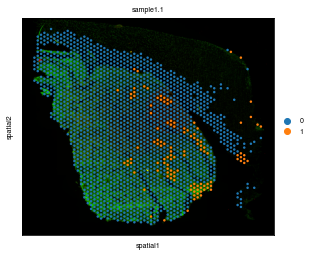

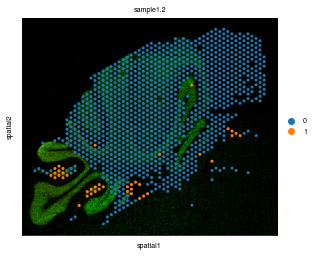

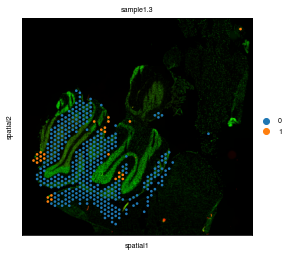

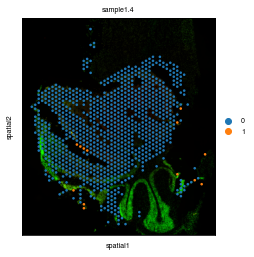

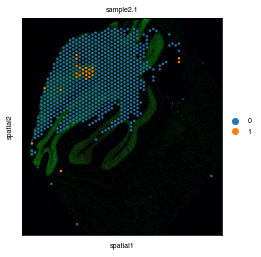

...

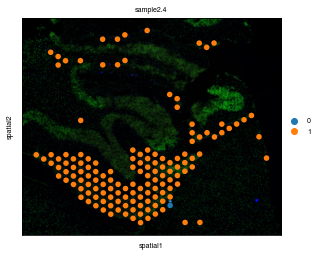

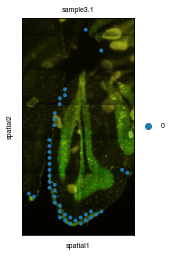

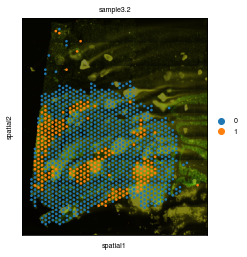

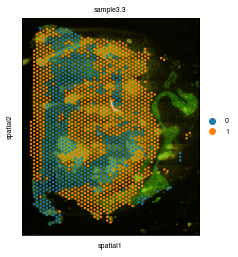

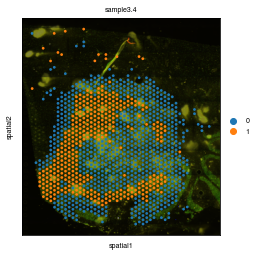

In [13]:
for sample in sorted(adatas.keys()):
    sc.pl.spatial(adatas[sample], color="segmentation_labels_clonegenes", title=sample)

In [14]:
adatas["sample3.3"].obs["segmentation_labels_clonegenes"] = pd.Categorical(
    1 - adatas["sample3.3"].obs.segmentation_labels_clonegenes.astype(int)
)

Here we plot normalized gene expression for each gene with varying copy number individually for each cluster.

/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kde.py:593: RuntimeWarning: invalid value encountered in divide
/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kdetools.py:32: RuntimeWarning: divide by zero encountered in double_scalars
/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kdetools.py:33: RuntimeWarning: invalid value encountered in multiply
/home/kats/.local/lib/python3.10/site-packages/scipy/interpolate/_interpolate.py:701: RuntimeWarning: invalid value encountered in divide
/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kde.py:593: RuntimeWarning: invalid value encountered in divide
/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kdetools.py:32: RuntimeWarning: divide by zero encountered in double_scalars
/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kdetools.py:33: RuntimeWarning: invalid value encountered in multiply
/h

/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kde.py:593: RuntimeWarning: invalid value encountered in divide
/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kdetools.py:32: RuntimeWarning: divide by zero encountered in double_scalars
/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kdetools.py:33: RuntimeWarning: invalid value encountered in multiply
/home/kats/.local/lib/python3.10/site-packages/scipy/interpolate/_interpolate.py:701: RuntimeWarning: invalid value encountered in divide
/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kde.py:593: RuntimeWarning: invalid value encountered in divide
/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kdetools.py:32: RuntimeWarning: divide by zero encountered in double_scalars
/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kdetools.py:33: RuntimeWarning: invalid value encountered in multiply
/h

/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kde.py:593: RuntimeWarning: invalid value encountered in divide
/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kdetools.py:32: RuntimeWarning: divide by zero encountered in double_scalars
/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kdetools.py:33: RuntimeWarning: invalid value encountered in multiply
/home/kats/.local/lib/python3.10/site-packages/scipy/interpolate/_interpolate.py:701: RuntimeWarning: invalid value encountered in divide
/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kde.py:593: RuntimeWarning: invalid value encountered in divide
/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kdetools.py:32: RuntimeWarning: divide by zero encountered in double_scalars
/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kdetools.py:33: RuntimeWarning: invalid value encountered in multiply
/h

/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kde.py:593: RuntimeWarning: invalid value encountered in divide
/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kdetools.py:32: RuntimeWarning: divide by zero encountered in double_scalars
/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kdetools.py:33: RuntimeWarning: invalid value encountered in multiply
/home/kats/.local/lib/python3.10/site-packages/scipy/interpolate/_interpolate.py:701: RuntimeWarning: invalid value encountered in divide
/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kde.py:593: RuntimeWarning: invalid value encountered in divide
/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kdetools.py:32: RuntimeWarning: divide by zero encountered in double_scalars
/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kdetools.py:33: RuntimeWarning: invalid value encountered in multiply
/h

/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kde.py:593: RuntimeWarning: invalid value encountered in divide
/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kdetools.py:32: RuntimeWarning: divide by zero encountered in double_scalars
/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kdetools.py:33: RuntimeWarning: invalid value encountered in multiply
/home/kats/.local/lib/python3.10/site-packages/scipy/interpolate/_interpolate.py:701: RuntimeWarning: invalid value encountered in divide
/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kde.py:593: RuntimeWarning: invalid value encountered in divide
/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kdetools.py:32: RuntimeWarning: divide by zero encountered in double_scalars
/home/kats/.local/lib/python3.10/site-packages/statsmodels/nonparametric/kdetools.py:33: RuntimeWarning: invalid value encountered in multiply
/h

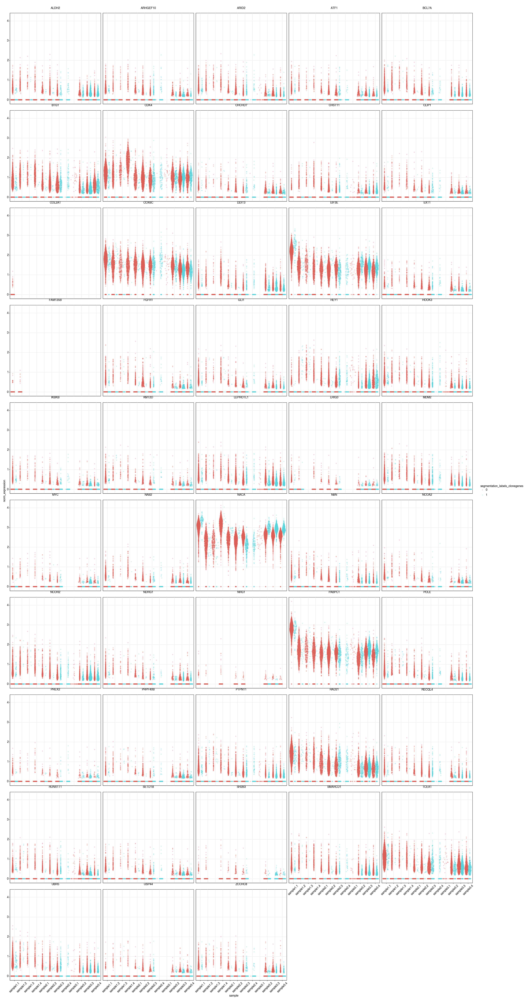

<ggplot: (8740107709119)>

In [15]:
df = pd.concat(
    (
        sc.get.obs_df(
            adatas[sample],
            keys=["segmentation_labels_clonegenes"]
            + list(filter(lambda x: x in adatas[sample].var_names, clonegenes)),
        )
        .melt(
            id_vars=["segmentation_labels_clonegenes"],
            var_name="gene",
            value_name="norm_expression",
        )
        .assign(sample=sample)
        for sample in adatas.keys()
    )
).assign(
    segmentation_labels_clonegenes=lambda x: pd.Categorical(
        x.segmentation_labels_clonegenes
    )
)
(
    ggplot(
        df,
        aes("sample", "norm_expression", color="segmentation_labels_clonegenes"),
    )
    + geom_sina(shape=".", alpha=0.2, scale="width")
    + facet_wrap("gene", ncol=5)
    + theme(figure_size=(20, 20), dpi=200, axis_text_x=element_text(rotation=45))
)

Samples 3.2, 3.3, and 3.4 are the only ones with somewhat consistent results, so we will only use those for further clone analysis.

/home/kats/.local/lib/python3.10/site-packages/plotnine/ggplot.py:718: PlotnineWarning: Saving 3 x 1.95 in image.
/home/kats/.local/lib/python3.10/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Filename: figures/S16_pdx_violin.svgz
/home/kats/.local/lib/python3.10/site-packages/plotnine/utils.py:693: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
/home/kats/.local/lib/python3.10/site-packages/plotnine/utils.py:694: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
/home/kats/.loca

/home/kats/.local/lib/python3.10/site-packages/plotnine/utils.py:693: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
/home/kats/.local/lib/python3.10/site-packages/plotnine/utils.py:694: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
/home/kats/.local/lib/python3.10/site-packages/plotnine/utils.py:693: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[

/home/kats/.local/lib/python3.10/site-packages/plotnine/utils.py:693: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
/home/kats/.local/lib/python3.10/site-packages/plotnine/utils.py:694: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
/home/kats/.local/lib/python3.10/site-packages/plotnine/utils.py:693: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[

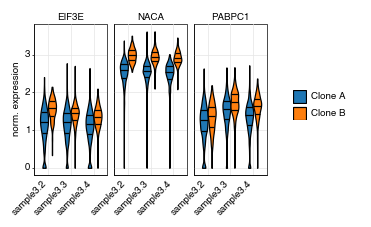

In [16]:
p = (
    ggplot(
        df[
            df.gene.isin(("EIF3E", "NACA", "PABPC1"))
            & df["sample"].isin(("sample3.2", "sample3.3", "sample3.4"))
        ],
        aes("sample", "norm_expression", fill="segmentation_labels_clonegenes"),
    )
    + geom_violin(
        scale="width",
        color="black",
        n=4096,
        width=0.7,
        draw_quantiles=[0.25, 0.5, 0.75],
    )
    + scale_fill_manual(
        values=adatas["sample3.4"].uns["segmentation_labels_colors"],
        labels=["Clone A", "Clone B"],
    )
    + labs(x=None, y="norm. expression", fill="")
    + facet_wrap("gene", ncol=5)
    + theme(
        aspect_ratio="auto",
        axis_text_x=element_text(rotation=45, ha="right"),
        axis_ticks_major_x=element_blank(),
        figure_size=(3, 1.95),
    )
)
p.save("figures/S16_pdx_violin.svgz")
print(p)

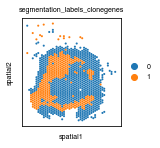

In [17]:
with mpl.rc_context({"figure.figsize": (4, 2)}):
    sc.pl.spatial(
        adatas["sample3.4"],
        color="segmentation_labels_clonegenes",
        img_key=None,
        size=1.5,
        show=False,
    )
    plt.savefig("figures/6A_clones.svgz")
    plt.show()

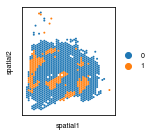

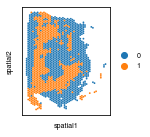

In [31]:
with mpl.rc_context({"figure.figsize": (3, 2)}):
    for sample in ("3.2", "3.3"):
        sc.pl.spatial(
            adatas[f"sample{sample}"],
            color="segmentation_labels_clonegenes",
            title="",
            img_key=None,
            size=1.5,
            show=False,
        )
        plt.savefig(f"figures/S17_clones_{sample}.svgz")
        plt.show()

We repeat the clone assignment, but using Leiden clustering.

/home/kats/.local/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


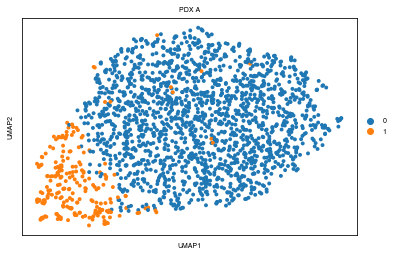

/home/kats/.local/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


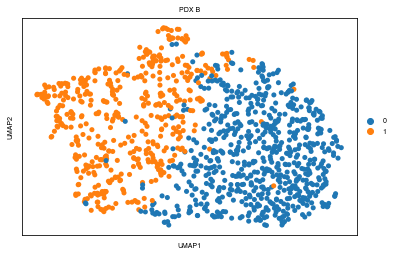

/home/kats/.local/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


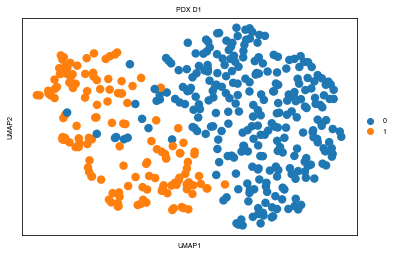

/home/kats/.local/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


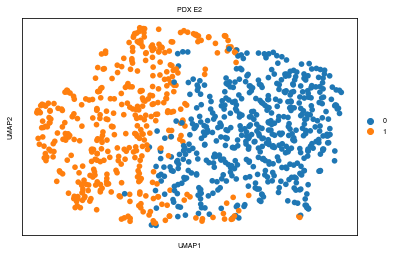

/home/kats/.local/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


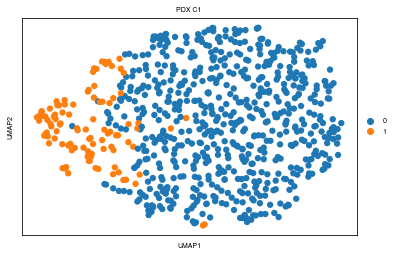

/home/kats/.local/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


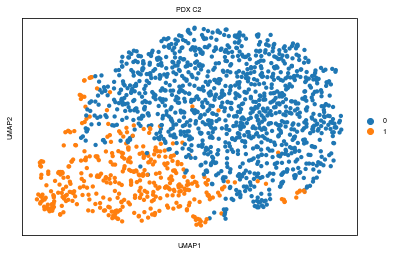

/home/kats/.local/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


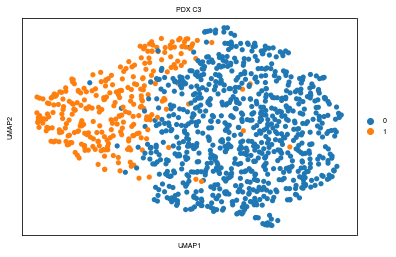

/home/kats/.local/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


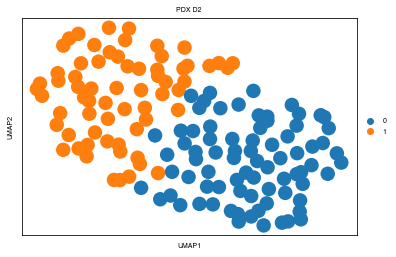

KeyError: '3.1'

In [36]:
for sname in sorted(adatas.keys()):
    sample = adatas[sname]
    cgenes = list(filter(lambda x: x in sample.var_names, clonegenes))
    sample.obsm["clonegenes"] = sample[:, cgenes].X.copy()
    sc.pp.neighbors(sample, n_neighbors=10, use_rep="clonegenes", key_added="cloneneighbors")
    sc.tl.umap(sample, neighbors_key="cloneneighbors", min_dist=0.001, spread=2)
    sc.tl.leiden(sample, neighbors_key="cloneneighbors", resolution=0.45)
    sc.pl.umap(sample, title=pdx_sample_map[sname[-3:]], color="leiden")

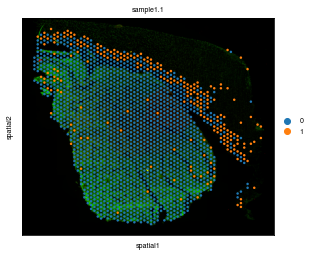

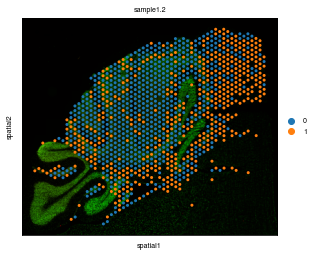

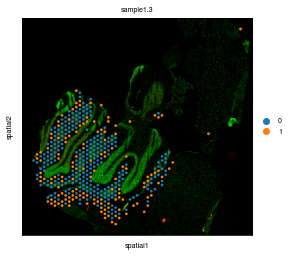

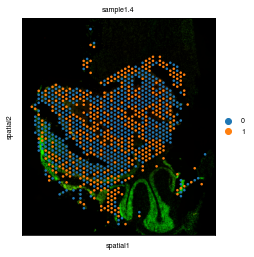

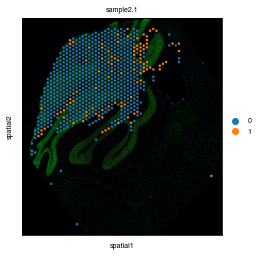

...

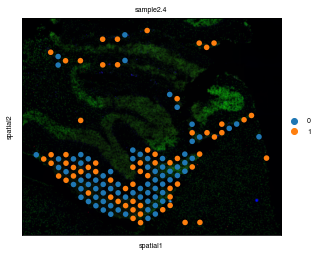

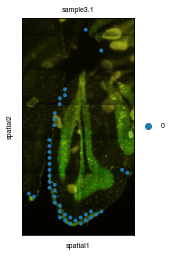

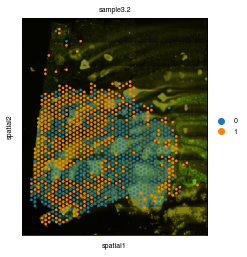

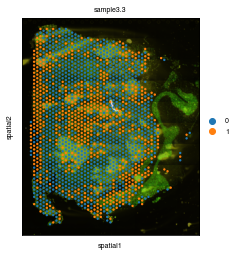

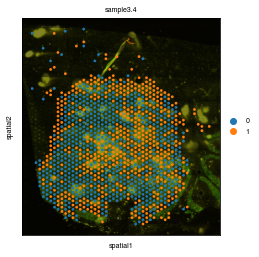

In [33]:
for sample in sorted(adatas.keys()):
    sc.pl.spatial(adatas[sample], color="leiden", title=sample)

/home/kats/.local/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/home/kats/.local/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/home/kats/.local/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


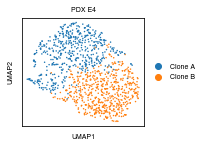

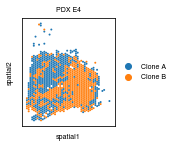

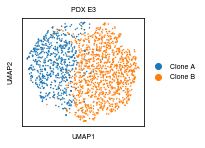

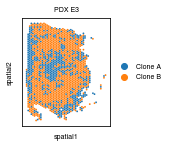

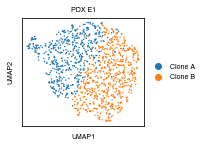

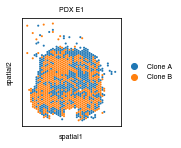

In [38]:
for sname in ("sample3.2", "sample3.3", "sample3.4"):
    adatas[sname].obs["leiden"] = pd.Categorical(
        1 - adatas[sname].obs.leiden.astype(int)
    )
    adatas[sname].obs["leiden_labels"] = adatas[sname].obs.leiden.cat.rename_categories(
        {0: "Clone A", 1: "Clone B"}
    )
    with mpl.rc_context({"figure.figsize": (2.2, 2)}):
        sc.pl.umap(adatas[sname], color="leiden_labels", title=pdx_sample_map[sname[-3:]], size=9, show=False)
        plt.savefig(f"figures/S11_pdx_{sname}_umap.svgz")

        sc.pl.spatial(
            adatas[sname],
            color="leiden_labels",
            title=pdx_sample_map[sname[-3:]],
            size=1.5,
            img_key=None,
            show=False,
        )
        plt.savefig(f"figures/S16_pdx_{sname}_spatial.svgz")